Hello Cory!

I’m happy to review your project today.
I will mark your mistakes and give you some hints how it is possible to fix them. We are getting ready for real job, where your team leader/senior colleague will do exactly the same. Don't worry and study with pleasure!

Below you will find my comments - **please do not move, modify or delete them**.

You can find my comments in green, yellow or red boxes like this:

<div class="alert alert-block alert-success">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

Success. Everything is done succesfully.
</div>

<div class="alert alert-block alert-warning">
<b>Reviewer's comment</b> <a class="tocSkip"></a>

Remarks. Some recommendations.
</div>

<div class="alert alert-block alert-danger">

<b>Reviewer's comment</b> <a class="tocSkip"></a>

Needs fixing. The block requires some corrections. Work can't be accepted with the red comments.
</div>

You can answer me by using this:

<div class="alert alert-block alert-info">
<b>Student answer.</b> <a class="tocSkip"></a>

Text here.
</div>


# Project Statement

The Film Junky Union, a new edgy community for classic movie enthusiasts, is developing a system for filtering and categorizing movie reviews. The goal is to train a model to automatically detect negative reviews. You'll be using a dataset of IMBD movie reviews with polarity labelling to build a model for classifying positive and negative reviews. It will need to have an F1 score of at least 0.85.

## Initialization

In [1]:
from os import path
from PIL import Image
import math
import numpy as np
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.figure_factory import create_distplot
from plotly.subplots import make_subplots


from tqdm.auto import tqdm
from sklearn.dummy import DummyClassifier

from sklearn.metrics import confusion_matrix, classification_report, auc
import sklearn.cluster as cluster
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import cross_val_score, RepeatedStratifiedKFold
from sklearn.model_selection import train_test_split, RandomizedSearchCV
import time
import torch
import transformers
from sklearn.feature_extraction.text import TfidfVectorizer
import spacy

In [2]:
%matplotlib inline
%config InlineBackend.figure_format = 'png'
# the next line provides graphs of better quality on HiDPI screens
%config InlineBackend.figure_format = 'retina'

plt.style.use('seaborn')

In [3]:
# this is to use progress_apply, read more at https://pypi.org/project/tqdm/#pandas-integration
tqdm.pandas()

## Load Data

In [4]:
df_reviews = pd.read_csv('/datasets/imdb_reviews.tsv', sep='\t', dtype={'votes': 'Int64'})

In [5]:
df_reviews.shape

(47331, 17)

In [6]:
df_reviews.columns

Index(['tconst', 'title_type', 'primary_title', 'original_title', 'start_year',
       'end_year', 'runtime_minutes', 'is_adult', 'genres', 'average_rating',
       'votes', 'review', 'rating', 'sp', 'pos', 'ds_part', 'idx'],
      dtype='object')

In [7]:
df_reviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47331 entries, 0 to 47330
Data columns (total 17 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   tconst           47331 non-null  object 
 1   title_type       47331 non-null  object 
 2   primary_title    47331 non-null  object 
 3   original_title   47331 non-null  object 
 4   start_year       47331 non-null  int64  
 5   end_year         47331 non-null  object 
 6   runtime_minutes  47331 non-null  object 
 7   is_adult         47331 non-null  int64  
 8   genres           47331 non-null  object 
 9   average_rating   47329 non-null  float64
 10  votes            47329 non-null  Int64  
 11  review           47331 non-null  object 
 12  rating           47331 non-null  int64  
 13  sp               47331 non-null  object 
 14  pos              47331 non-null  int64  
 15  ds_part          47331 non-null  object 
 16  idx              47331 non-null  int64  
dtypes: Int64(1),

In [8]:
df_reviews.isnull().sum()

tconst             0
title_type         0
primary_title      0
original_title     0
start_year         0
end_year           0
runtime_minutes    0
is_adult           0
genres             0
average_rating     2
votes              2
review             0
rating             0
sp                 0
pos                0
ds_part            0
idx                0
dtype: int64

In [9]:
df_reviews['average_rating'] = df_reviews['average_rating'].fillna('None')
df_reviews['votes'] = df_reviews['votes'].fillna(0)

In [10]:
display(df_reviews)

,tconst,title_type,primary_title,original_title,start_year,end_year,runtime_minutes,is_adult,genres,average_rating,votes,review,rating,sp,pos,ds_part,idx
0,tt0068152,movie,$,$,1971,\N,121,0,"Comedy,Crime,Drama",6.3,2218,The pakage implies that Warren Beatty and Gold...,1,neg,0,train,8335
1,tt0068152,movie,$,$,1971,\N,121,0,"Comedy,Crime,Drama",6.3,2218,How the hell did they get this made?! Presenti...,1,neg,0,train,8336
2,tt0313150,short,'15','15',2002,\N,25,0,"Comedy,Drama,Short",6.3,184,There is no real story the film seems more lik...,3,neg,0,test,2489
3,tt0313150,short,'15','15',2002,\N,25,0,"Comedy,Drama,Short",6.3,184,Um .... a serious film about troubled teens in...,7,pos,1,test,9280
4,tt0313150,short,'15','15',2002,\N,25,0,"Comedy,Drama,Short",6.3,184,I'm totally agree with GarryJohal from Singapo...,9,pos,1,test,9281
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
47326,tt0068398,tvEpisode,Étude in Black,Étude in Black,1972,\N,97,0,"Crime,Drama,Mystery",7.7,2254,This is another of my favorite Columbos. It sp...,10,pos,1,test,6038
47327,tt0223503,tvMovie,Îhatôbu gensô: KENjI no haru,Îhatôbu gensô: KENjI no haru,1996,\N,55,0,"Animation,Biography,Drama",7.3,278,Talk about being boring! I got this expecting ...,4,neg,0,test,989
47328,tt0223503,tvMovie,Îhatôbu gensô: KENjI no haru,Îhatôbu gensô: KENjI no haru,1996,\N,55,0,"Animation,Biography,Drama",7.3,278,"I never thought I'd say this about a biopic, b...",8,pos,1,test,4163
47329,tt0223503,tvMovie,Îhatôbu gensô: KENjI no haru,Îhatôbu gensô: KENjI no haru,1996,\N,55,0,"Animation,Biography,Drama",7.3,278,Spirit and Chaos is an artistic biopic of Miya...,9,pos,1,test,4164


In [11]:
df_reviews.describe()

,start_year,is_adult,votes,rating,pos,idx
count,47331.000000,47331.000000,4.733100e+04,47331.000000,47331.000000,47331.000000
mean,1989.631235,0.001732,2.556184e+04,5.484608,0.498954,6279.697999
std,19.600364,0.041587,8.366844e+04,3.473109,0.500004,3605.702545
min,1894.000000,0.000000,0.000000e+00,1.000000,0.000000,0.000000
25%,1982.000000,0.000000,8.260000e+02,2.000000,0.000000,3162.000000
50%,1998.000000,0.000000,3.197000e+03,4.000000,0.000000,6299.000000
75%,2004.000000,0.000000,1.397400e+04,9.000000,1.000000,9412.000000
max,2010.000000,1.000000,1.739448e+06,10.000000,1.000000,12499.000000


In [12]:
df_reviews[['votes','rating', 'average_rating', 'is_adult', 'pos']].corr(method='pearson')

,votes,rating,is_adult,pos
votes,1.000000,0.054154,-0.012192,0.052350
rating,0.054154,1.000000,0.004866,0.941231
is_adult,-0.012192,0.004866,1.000000,0.005168
pos,0.052350,0.941231,0.005168,1.000000


In [13]:
titles = df_reviews.groupby('title_type')['rating']

titles.describe().head(10)

,count,mean,std,min,25%,50%,75%,max
title_type,,,,,,,,
movie,36861.0,5.533491,3.414215,1.0,2.00,7.0,9.0,10.0
short,887.0,7.096956,3.027649,1.0,4.00,8.0,10.0,10.0
tvEpisode,635.0,6.639370,3.277496,1.0,3.50,8.0,10.0,10.0
tvMiniSeries,713.0,6.319776,3.575645,1.0,3.00,8.0,10.0,10.0
tvMovie,2892.0,5.067082,3.529046,1.0,2.00,4.0,9.0,10.0
tvSeries,2246.0,6.166073,3.819832,1.0,2.00,8.0,10.0,10.0
tvShort,18.0,6.388889,3.775134,1.0,3.25,7.5,10.0,10.0
tvSpecial,183.0,7.792350,3.031075,1.0,7.00,9.0,10.0,10.0
video,2742.0,3.417214,3.094564,1.0,1.00,2.0,4.0,10.0


In [14]:
titles.mean().sort_values(ascending=False).head(10)

title_type
tvSpecial       7.792350
videoGame       7.733766
short           7.096956
tvEpisode       6.639370
tvShort         6.388889
tvMiniSeries    6.319776
tvSeries        6.166073
movie           5.533491
tvMovie         5.067082
video           3.417214
Name: rating, dtype: float64

<div class="alert alert-success">
<b>Reviewer's comment V1</b>

Correct

</div>

## EDA

Let's check the number of movies and reviews over years.

In [15]:
dft1 = df_reviews[['tconst', 'start_year']].drop_duplicates() \
    ['start_year'].value_counts().sort_index()
dft1 = dft1.reindex(index=np.arange(1990, dft1.index.max())).fillna(0)


dft2 = df_reviews.groupby(['start_year', 'pos'])['pos'].count().unstack()
dft2 = dft2.reindex(index=np.arange(1990, dft2.index.max())).fillna(0)


grouped_bar = px.bar(dft2, title='Number of Reviews Since 1990',
                     labels={"start_year": "Year", "value": "Review Count", "pos": "Review Sentiment:"},
                     width=1300)
grouped_bar.update_traces(texttemplate='%{y}', textposition='outside')

newnames = {'0':'Negative', '1': 'Positive'}
grouped_bar.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
grouped_bar.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
grouped_bar.update_layout(xaxis={"dtick":1})
grouped_bar.show()

dft2 = df_reviews['start_year'].value_counts().sort_index()
dft2 = dft2.reindex(index=np.arange(1990, dft2.index.max())).fillna(0)
dft3 = (dft2/dft1).fillna(0)

dft3.reset_index(drop=True).rolling(5).mean().plot(color='orange', label='reviews per movie (avg. over 5 years)')


bar = px.bar(dft1, 
             title='Number of Movies Since 1990', 
             labels={"start_year": "Year", "value": "Movie Count"}, 
             color='value', 
             width=1300)

bar.update_traces(texttemplate='%{y}', textposition='outside')

line = px.line(dft3)
line.update_traces(showlegend=True, yaxis="y2", name='reviews per movie (avg over 5 years)')

bar.add_traces(line.data)

bar.update_layout(
    yaxis2={"side": "right", "overlaying": "y"},
    xaxis_tickangle=0,
    coloraxis_colorbar_x=-0.15
)

bar.show()
plt.close()

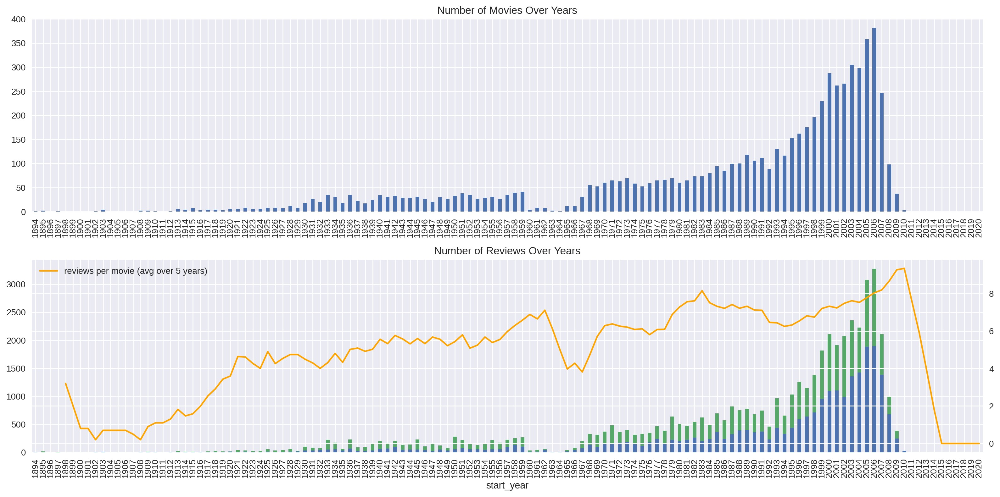

In [16]:
fig, axs = plt.subplots(2, 1, figsize=(16, 8))

ax = axs[0]

dft1 = df_reviews[['tconst', 'start_year']].drop_duplicates() \
    ['start_year'].value_counts().sort_index()
dft1 = dft1.reindex(index=np.arange(dft1.index.min(), max(dft1.index.max(), 2021))).fillna(0)
dft1.plot(kind='bar', ax=ax)
ax.set_title('Number of Movies Over Years')

ax = axs[1]

dft2 = df_reviews.groupby(['start_year', 'pos'])['pos'].count().unstack()
dft2 = dft2.reindex(index=np.arange(dft2.index.min(), max(dft2.index.max(), 2021))).fillna(0)

dft2.plot(kind='bar', stacked=True, label='#reviews (neg, pos)', ax=ax)

dft2 = df_reviews['start_year'].value_counts().sort_index()
dft2 = dft2.reindex(index=np.arange(dft2.index.min(), max(dft2.index.max(), 2021))).fillna(0)
dft3 = (dft2/dft1).fillna(0)
axt = ax.twinx()
dft3.reset_index(drop=True).rolling(5).mean().plot(color='orange', label='reviews per movie (avg over 5 years)', ax=axt)

lines, labels = axt.get_legend_handles_labels()
ax.legend(lines, labels, loc='upper left')

ax.set_title('Number of Reviews Over Years')

fig.tight_layout()

Let's check the distribution of number of reviews per movie with the exact counting and KDE (just to learn how it may differ from the exact counting)

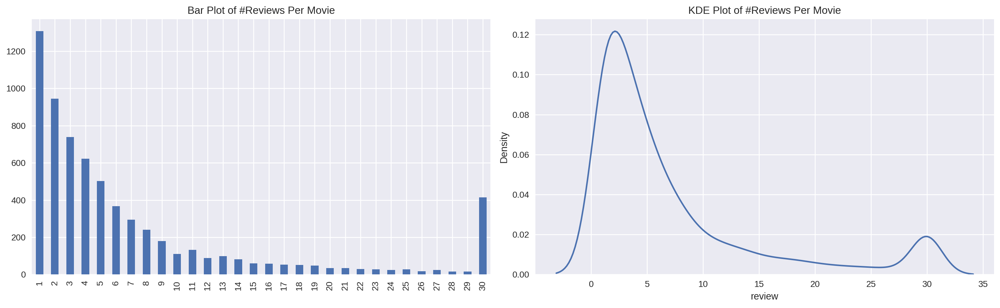

In [17]:
fig, axs = plt.subplots(1, 2, figsize=(16, 5))

ax = axs[0]
dft = df_reviews.groupby('tconst')['review'].count() \
    .value_counts() \
    .sort_index()
dft.plot.bar(ax=ax)
ax.set_title('Bar Plot of #Reviews Per Movie')

ax = axs[1]
dft = df_reviews.groupby('tconst')['review'].count()
sns.kdeplot(dft, ax=ax)
ax.set_title('KDE Plot of #Reviews Per Movie')

fig.tight_layout()

In [18]:
dft = df_reviews.groupby('tconst')['review'].count() \
    .value_counts() \
    .sort_index()


bar = px.bar(dft, title='Bar Plot of #Reviews Per Movie', 
            labels={"review": "Number of Reviews","value": "Review Frequency"}, width=1300)

bar.update_layout(showlegend=False)
bar.update_layout(xaxis={"dtick":1})
bar.show()

dft = df_reviews.groupby('tconst')['review'].count()

fig = ff.create_distplot(
    [dft.tolist()],
    group_labels=["Dist."],
    show_hist=True,
)
fig.update_layout(height=800,title='KDE Plot of #Reviews Per Movie', showlegend=False)
fig.update_layout(xaxis={"dtick":1})
fig.show()

**`Findings`**

From our top 2 charts above, we see a large upwards trend in the number of reviews per movie starting in the early 1990s as the VHS format was becoming more accessible/economic and DVDs were introduced into the market (1996). 

Our bottom 2 charts, show us the frequency of reviews per movie. We see a large concentration of less than 5 reviews per movie with an outlier instance with 30 reviews. This could lead to class imbalancing or another type of 'skewness' depending on the type of review (negative vs positive).

In [19]:
df_reviews['pos'].value_counts()

0    23715
1    23616
Name: pos, dtype: int64

In [20]:
dft1 = df_reviews[['tconst', 'start_year']].drop_duplicates() \
    ['start_year'].value_counts().sort_index()
dft1 = dft1.reindex(index=np.arange(dft1.index.min(), max(dft1.index.max(), 2021))).fillna(0)

dft2 = df_reviews.groupby(['start_year', 'pos'])['pos'].count().unstack()
dft2 = dft2.reindex(index=np.arange(dft2.index.min(), max(dft2.index.max(), 2021))).fillna(0)


grouped_bar = px.bar(dft2, title='Number of Reviews Over the Years', 
            labels={"start_year": "Year", "value": "Review Count", "pos": "Review Sentiment:"}, width=1300)

newnames = {'0':'Negative', '1': 'Positive'}
grouped_bar.for_each_trace(lambda t: t.update(name = newnames[t.name],
                                      legendgroup = newnames[t.name],
                                      hovertemplate = t.hovertemplate.replace(t.name, newnames[t.name])
                                     )
                  )
grouped_bar.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))

grouped_bar.show()

dft2 = df_reviews['start_year'].value_counts().sort_index()
dft2 = dft2.reindex(index=np.arange(dft2.index.min(), max(dft2.index.max(), 2021))).fillna(0)
dft3 = (dft2/dft1).fillna(0)

dft3.reset_index(drop=True).rolling(5).mean().plot(color='orange', label='reviews per movie (avg. over 5 years)')

bar = px.bar(dft1, title='Number of Movies Over the Years', 
            labels={"start_year": "Year","value": "Movie Count"}, color='value', width=1300).add_traces(px.line(dft3).update_traces(showlegend=True,yaxis="y2", name='reviews per movie (avg over 5 years)').data).update_layout(yaxis2={"side":"right", "overlaying":"y"})

bar.update_layout(xaxis_tickangle=-90, coloraxis_colorbar_x=-0.15)
bar.update_coloraxes(colorbar_title_text='Scale', colorbar_tickangle=-90, colorbar_bordercolor='lightgray', colorbar_borderwidth=1)
bar.update_layout(legend=dict(
    orientation="h",
    yanchor="bottom",
    y=1.02,
    xanchor="right",
    x=1
))
bar.show()

plt.close()

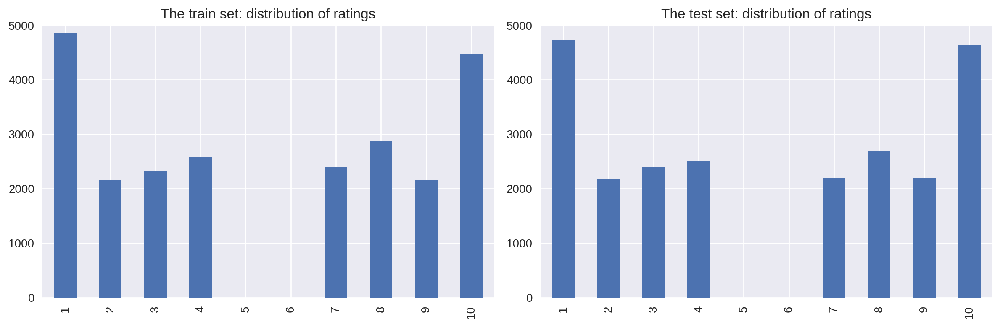

In [21]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

ax = axs[0]
dft = df_reviews.query('ds_part == "train"')['rating'].value_counts().sort_index()
dft = dft.reindex(index=np.arange(min(dft.index.min(), 1), max(dft.index.max(), 11))).fillna(0)
dft.plot.bar(ax=ax)
ax.set_ylim([0, 5000])
ax.set_title('The train set: distribution of ratings')

ax = axs[1]
dft = df_reviews.query('ds_part == "test"')['rating'].value_counts().sort_index()
dft = dft.reindex(index=np.arange(min(dft.index.min(), 1), max(dft.index.max(), 11))).fillna(0)
dft.plot.bar(ax=ax)
ax.set_ylim([0, 5000])
ax.set_title('The test set: distribution of ratings')

fig.tight_layout()

Distribution of negative and positive reviews over the years for two parts of the dataset

/opt/conda/envs/python3/lib/python3.9/site-packages/seaborn/distributions.py:1666: UserWarning:

Support for alternate kernels has been removed. Using Gaussian kernel.

/opt/conda/envs/python3/lib/python3.9/site-packages/seaborn/distributions.py:1666: UserWarning:

Support for alternate kernels has been removed. Using Gaussian kernel.

/opt/conda/envs/python3/lib/python3.9/site-packages/seaborn/distributions.py:1666: UserWarning:

Support for alternate kernels has been removed. Using Gaussian kernel.

/opt/conda/envs/python3/lib/python3.9/site-packages/seaborn/distributions.py:1666: UserWarning:

Support for alternate kernels has been removed. Using Gaussian kernel.



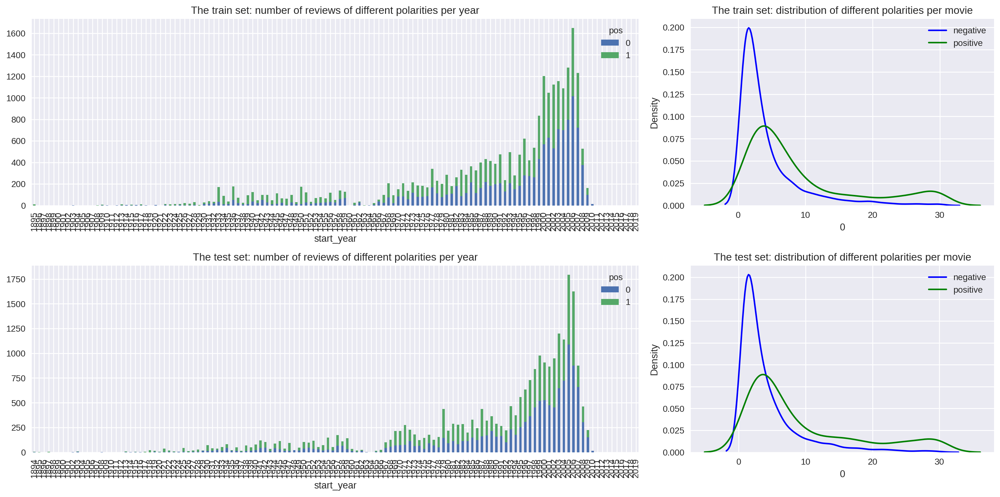

In [22]:
fig, axs = plt.subplots(2, 2, figsize=(16, 8), gridspec_kw=dict(width_ratios=(2, 1), height_ratios=(1, 1)))

ax = axs[0][0]

dft = df_reviews.query('ds_part == "train"').groupby(['start_year', 'pos'])['pos'].count().unstack()
dft.index = dft.index.astype('int')
dft = dft.reindex(index=np.arange(dft.index.min(), max(dft.index.max(), 2020))).fillna(0)
dft.plot(kind='bar', stacked=True, ax=ax)
ax.set_title('The train set: number of reviews of different polarities per year')

ax = axs[0][1]

dft = df_reviews.query('ds_part == "train"').groupby(['tconst', 'pos'])['pos'].count().unstack()
sns.kdeplot(dft[0], color='blue', label='negative', kernel='epa', ax=ax)
sns.kdeplot(dft[1], color='green', label='positive', kernel='epa', ax=ax)
ax.legend()
ax.set_title('The train set: distribution of different polarities per movie')

ax = axs[1][0]

dft = df_reviews.query('ds_part == "test"').groupby(['start_year', 'pos'])['pos'].count().unstack()
dft.index = dft.index.astype('int')
dft = dft.reindex(index=np.arange(dft.index.min(), max(dft.index.max(), 2020))).fillna(0)
dft.plot(kind='bar', stacked=True, ax=ax)
ax.set_title('The test set: number of reviews of different polarities per year')

ax = axs[1][1]

dft = df_reviews.query('ds_part == "test"').groupby(['tconst', 'pos'])['pos'].count().unstack()
sns.kdeplot(dft[0], color='blue', label='negative', kernel='epa', ax=ax)
sns.kdeplot(dft[1], color='green', label='positive', kernel='epa', ax=ax)
ax.legend()
ax.set_title('The test set: distribution of different polarities per movie')

fig.tight_layout()

In [23]:
pos_counts = df_reviews['pos'].value_counts().reset_index()
pos_counts.columns = ['pos', 'count']


fig = px.bar(pos_counts,
             x='pos',
             y='count',
             labels={'pos': 'Negative: 0 / Positive: 1', 'count': 'Class Count'},
             color='count',
             text='count',
             title='Class Balance',
             width=400)

fig.update_traces(textposition='outside')
fig.update_layout(showlegend=False)
fig.update_coloraxes(showscale=False)
fig.show()

In [24]:
dft = df_reviews.query('ds_part == "train"')['rating'].value_counts().sort_index()
dft = dft.reindex(index=np.arange(min(dft.index.min(), 1), max(dft.index.max(), 11))).fillna(0)

dft_df = dft.reset_index()
dft_df.columns = ['rating', 'count']

fig = px.bar(dft_df,
             x='rating',
             y='count',
             text='count',
             labels={'rating': 'Rating Score', 'count': 'Count (#)'},
             title='The train set: distribution of ratings',
             width=1300)

fig.update_traces(textposition='outside')
fig.update_layout(showlegend=False)
fig.update_coloraxes(showscale=False)
fig.show()

dft = df_reviews.query('ds_part == "test"')['rating'].value_counts().sort_index()
dft = dft.reindex(index=np.arange(min(dft.index.min(), 1), max(dft.index.max(), 11))).fillna(0)

dft_df = dft.reset_index()
dft_df.columns = ['rating', 'count']

fig = px.bar(dft_df,
             x='rating',
             y='count',
             text='count',
             labels={'rating': 'Rating Score', 'count': 'Count (#)'},
             title='The test set: distribution of ratings',
             width=1300)

fig.update_traces(textposition='outside')
fig.update_layout(showlegend=False)
fig.update_coloraxes(showscale=False)
fig.show()

**`Findings`**

Visualizing our train and test set rating distributions lets us verify the expected similarities in both the distribution of ratings and the accompanying polarities.

<div class="alert alert-success">
<b>Reviewer's comment V1</b>

Good job!

</div>

## Evaluation Procedure

Composing an evaluation routine which can be used for all models in this project

In [25]:
import sklearn.metrics as metrics

def evaluate_model(model, train_features, train_target, test_features, test_target):
    
    eval_stats = {}
    
    fig, axs = plt.subplots(1, 3, figsize=(20, 6)) 
    
    for type, features, target in (('train', train_features, train_target), ('test', test_features, test_target)):
        
        eval_stats[type] = {}
    
        pred_target = model.predict(features)
        pred_proba = model.predict_proba(features)[:, 1]
        
        # F1
        f1_thresholds = np.arange(0, 1.01, 0.05)
        f1_scores = [metrics.f1_score(target, pred_proba>=threshold) for threshold in f1_thresholds]
        
        # ROC
        fpr, tpr, roc_thresholds = metrics.roc_curve(target, pred_proba)
        roc_auc = metrics.roc_auc_score(target, pred_proba)    
        eval_stats[type]['ROC AUC'] = roc_auc

        # PRC
        precision, recall, pr_thresholds = metrics.precision_recall_curve(target, pred_proba)
        aps = metrics.average_precision_score(target, pred_proba)
        eval_stats[type]['APS'] = aps
        
        if type == 'train':
            color = 'blue'
        else:
            color = 'green'

        # F1 Score
        ax = axs[0]
        max_f1_score_idx = np.argmax(f1_scores)
        ax.plot(f1_thresholds, f1_scores, color=color, label=f'{type}, max={f1_scores[max_f1_score_idx]:.2f} @ {f1_thresholds[max_f1_score_idx]:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(f1_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'
            ax.plot(f1_thresholds[closest_value_idx], f1_scores[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('threshold')
        ax.set_ylabel('F1')
        ax.legend(loc='lower center')
        ax.set_title(f'F1 Score') 

        # ROC
        ax = axs[1]    
        ax.plot(fpr, tpr, color=color, label=f'{type}, ROC AUC={roc_auc:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(roc_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'            
            ax.plot(fpr[closest_value_idx], tpr[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.plot([0, 1], [0, 1], color='grey', linestyle='--')
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('FPR')
        ax.set_ylabel('TPR')
        ax.legend(loc='lower center')        
        ax.set_title(f'ROC Curve')
        
        # PRC
        ax = axs[2]
        ax.plot(recall, precision, color=color, label=f'{type}, AP={aps:.2f}')
        # setting crosses for some thresholds
        for threshold in (0.2, 0.4, 0.5, 0.6, 0.8):
            closest_value_idx = np.argmin(np.abs(pr_thresholds-threshold))
            marker_color = 'orange' if threshold != 0.5 else 'red'
            ax.plot(recall[closest_value_idx], precision[closest_value_idx], color=marker_color, marker='X', markersize=7)
        ax.set_xlim([-0.02, 1.02])    
        ax.set_ylim([-0.02, 1.02])
        ax.set_xlabel('recall')
        ax.set_ylabel('precision')
        ax.legend(loc='lower center')
        ax.set_title(f'PRC')        

        eval_stats[type]['Accuracy'] = metrics.accuracy_score(target, pred_target)
        eval_stats[type]['F1'] = metrics.f1_score(target, pred_target)
    
    df_eval_stats = pd.DataFrame(eval_stats)
    df_eval_stats = df_eval_stats.round(2)
    df_eval_stats = df_eval_stats.reindex(index=('Accuracy', 'F1', 'APS', 'ROC AUC'))
    
    print(df_eval_stats)
    
    return

## Normalization

We assume all models below accepts texts in lowercase and without any digits, punctuations marks etc.

In [26]:
import re 

In [27]:
def normalize(review):
    review = review.lower()  # Convert to lowercase
    pattern = r"[^a-zA-Z' ]"
    review = re.sub(pattern, '', review)
    
    return " ".join(review.split())

df_reviews['review_norm'] = df_reviews['review'].apply(normalize)

<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

You forgot to lowercase texts

</div>

## Train / Test Split

Luckily, the whole dataset is already divided into train/test one parts. The corresponding flag is 'ds_part'.

In [28]:
df_reviews_train = df_reviews.query('ds_part == "train"').copy()
df_reviews_test = df_reviews.query('ds_part == "test"').copy()

train_target = df_reviews_train['pos']
test_target = df_reviews_test['pos']

print(df_reviews_train.shape)
print(df_reviews_test.shape)

(23796, 18)
(23535, 18)


In [29]:
corpus_train = df_reviews_train['review_norm']
corpus_test = df_reviews_test['review_norm']
random_state = 12345

## Working with models

### Model 0 - Constant

Strategy: most_frequent
          train  test
Accuracy    0.5   0.5
F1          0.0   0.0
APS         0.5   0.5
ROC AUC     0.5   0.5
------------------------------
Strategy: stratified
          train  test
Accuracy    0.5   0.5
F1          0.5   0.5
APS         0.5   0.5
ROC AUC     0.5   0.5
------------------------------
Strategy: uniform
          train  test
Accuracy    0.5   0.5
F1          0.5   0.5
APS         0.5   0.5
ROC AUC     0.5   0.5
------------------------------
Strategy: constant
          train  test
Accuracy    0.5   0.5
F1          0.0   0.0
APS         0.5   0.5
ROC AUC     0.5   0.5
------------------------------


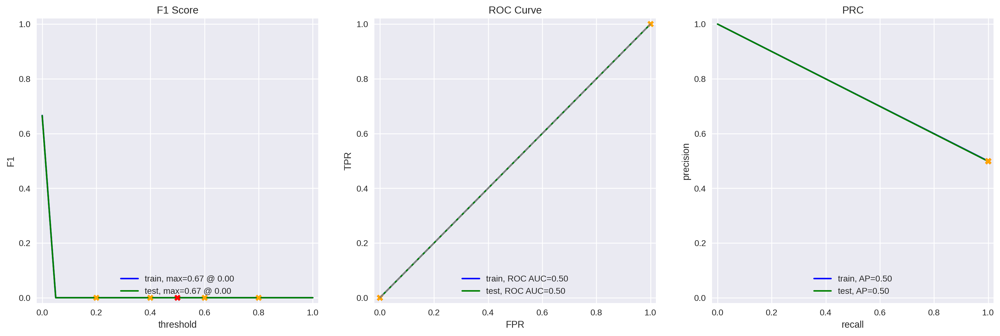

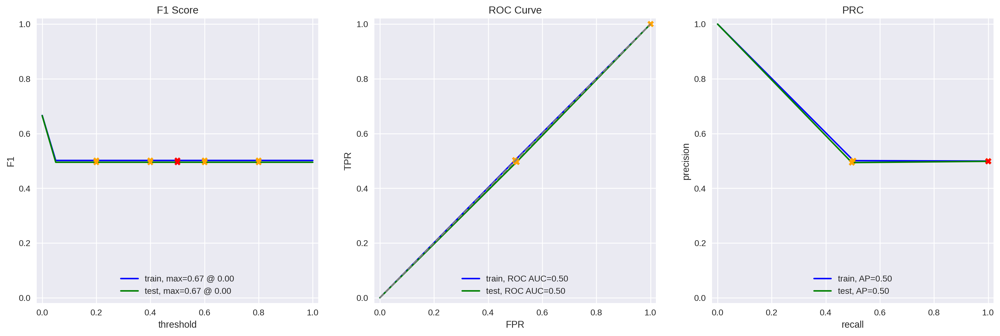

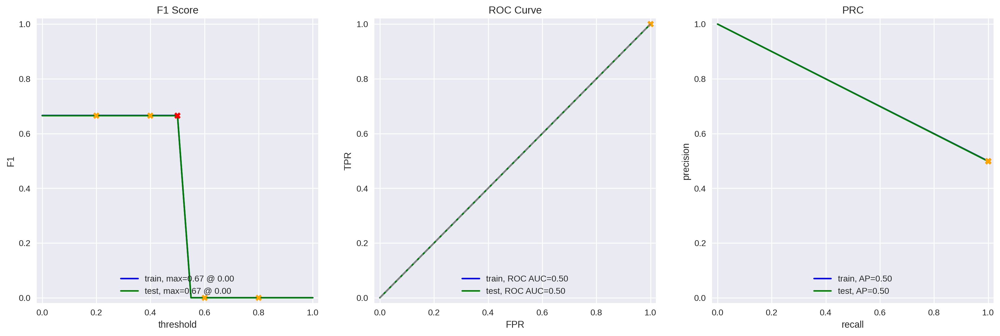

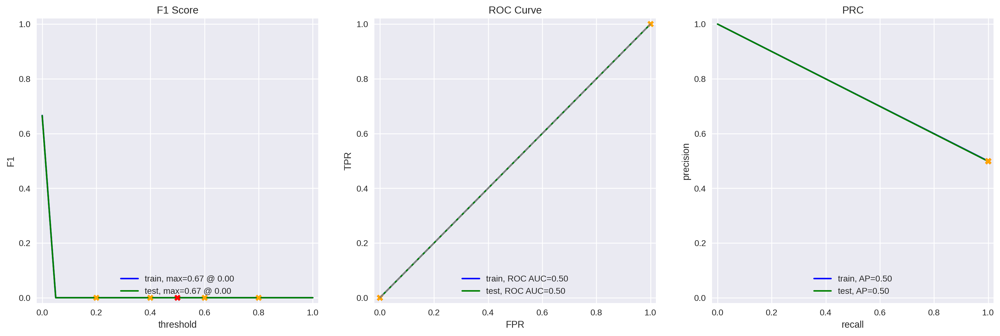

In [30]:
strategies = ['most_frequent', 'stratified', 'uniform', 'constant'] 

test_scores = [] 

for s in strategies: 
    if s == 'constant': 
        dummy_model = DummyClassifier(strategy=s, random_state=random_state, constant=0) 
    else: 
        dummy_model = DummyClassifier(strategy=s, random_state=random_state) 
    
    dummy_model.fit(corpus_train, train_target)
    test_scores.append(dummy_model.score(corpus_test, test_target))

    print(f"Strategy: {s}")
    evaluate_model(dummy_model, corpus_train, train_target, corpus_test, test_target)  # ✅ fixed
    print("-" * 30)

<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

You forgot to print the results. Since the main metric of this project is f1 score, you need to calculate and print this metric. Or you can use evaluate_model() function to print more metrics.

</div>

### Model 1 - NLTK, TF-IDF and LR

TF-IDF

In [31]:
import nltk

from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression

from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from nltk.stem import WordNetLemmatizer
from nltk.corpus import stopwords
import nltk
from nltk.corpus import stopwords
nltk.download('stopwords', download_dir='./nltk_data')
nltk.data.path.append('./nltk_data')
stop_words = set(stopwords.words('english'))

[nltk_data] Downloading package stopwords to ./nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


In [32]:
lemmatizer  = WordNetLemmatizer() 

In [33]:
def lemmatize(review):

    tokens = word_tokenize(review.lower())
    lemmas = [lemmatizer.lemmatize(token) for token in tokens]
    
    return " ".join(lemmas)

In [34]:
lr_corpus_train = corpus_train.apply(lemmatize) 
lr_corpus_test = corpus_test.apply(lemmatize)

count_tf_idf = TfidfVectorizer(stop_words=stop_words)
tf_idf = count_tf_idf.fit_transform(lr_corpus_train)

train_features_1 = tf_idf 
test_features_1 = count_tf_idf.transform(lr_corpus_test)

model_1 = LogisticRegression(random_state=random_state)
model_1.fit(train_features_1, train_target)

LogisticRegression(random_state=12345)

          train  test
Accuracy   0.94  0.88
F1         0.94  0.88
APS        0.98  0.95
ROC AUC    0.98  0.95


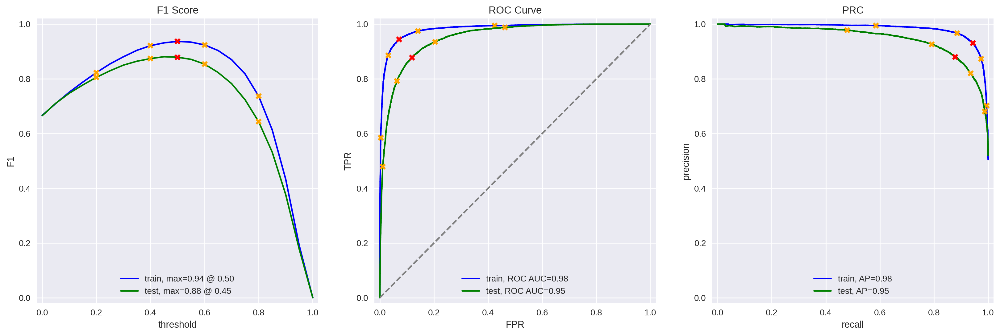

In [35]:
evaluate_model(model_1, train_features_1, train_target, test_features_1, test_target)

<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

You're working on english texts but using stop words for germany language. Moreover, you need to use stop words from nltk library but not from spacy

</div>

### Model 3 - spaCy, TF-IDF and LR

In [36]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
nlp.add_pipe('sentencizer')

def text_preprocessing_spacy(text):
    doc = nlp(text)
    tokens = [token.lemma_ for token in doc]
    return ' '.join(tokens)

In [37]:
lr_corpus_train_spacy = corpus_train.apply(text_preprocessing_spacy) 
lr_corpus_test_spacy = corpus_test.apply(text_preprocessing_spacy)

count_tf_idf_2 = TfidfVectorizer(stop_words=stop_words)

train_features_spacy = count_tf_idf_2.fit_transform(lr_corpus_train_spacy)
test_features_spacy = count_tf_idf_2.transform(lr_corpus_test_spacy)

model_2 = LogisticRegression(random_state=random_state)
model_2.fit(train_features_spacy, train_target)

LogisticRegression(random_state=12345)

          train  test
Accuracy   0.93  0.88
F1         0.93  0.88
APS        0.98  0.95
ROC AUC    0.98  0.95


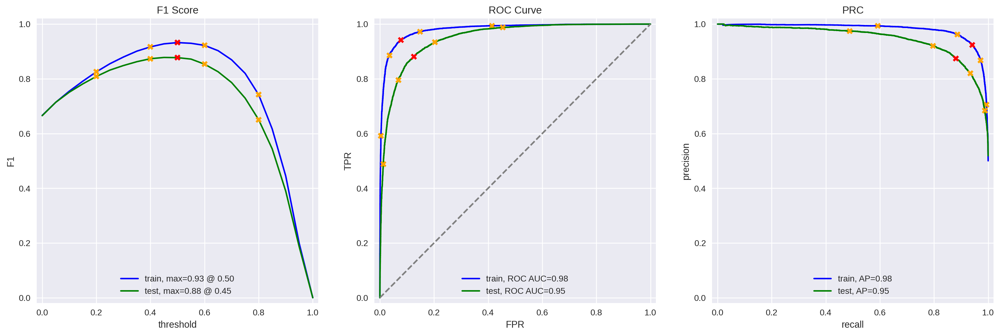

In [38]:
evaluate_model(model_2, train_features_spacy, train_target, test_features_spacy, test_target)

<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

You're working on english texts but using stop words for germany language. Moreover, you need to use stop words from nltk library but not from spacy

</div>

### Model 4 - spaCy, TF-IDF and LGBMClassifier

In [39]:
from lightgbm import LGBMClassifier

In [40]:
model_3 = LGBMClassifier(random_state=random_state)
model_3.fit(train_features_spacy, train_target)

LGBMClassifier(random_state=12345)

          train  test
Accuracy   0.91  0.86
F1         0.91  0.86
APS        0.97  0.93
ROC AUC    0.97  0.93


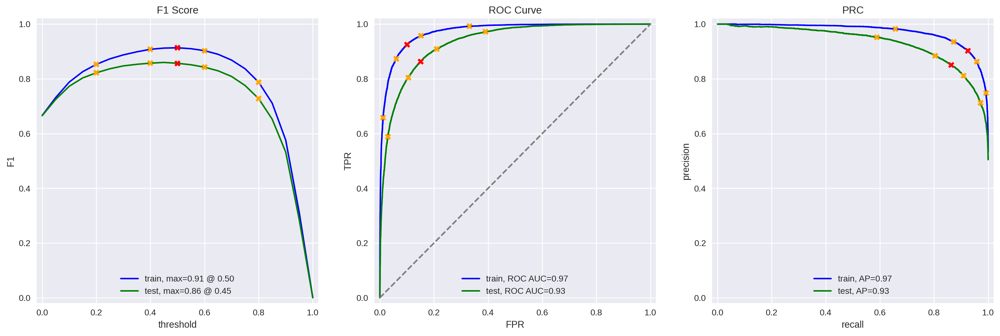

In [41]:
evaluate_model(model_3, train_features_spacy, train_target, test_features_spacy, test_target)

<div class="alert alert-success">
<b>Reviewer's comment V1</b>

Well done!

</div>

###  Model 9 - BERT

In [42]:
import torch
import transformers

In [43]:
tokenizer = transformers.BertTokenizer.from_pretrained('bert-base-uncased')
config = transformers.BertConfig.from_pretrained('bert-base-uncased')
model = transformers.BertModel.from_pretrained('bert-base-uncased')

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.seq_relationship.bias', 'cls.predictions.transform.dense.weight', 'cls.seq_relationship.weight', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.decoder.weight', 'cls.predictions.transform.LayerNorm.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.bias']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


In [44]:
import gc 
def BERT_text_to_embeddings(texts, max_length=256, sample_size=1000, batch_size=8, force_device=None, disable_progress_bar=False):

    texts = texts.dropna()
    if len(texts) == 0:
        raise ValueError("Input text series is empty after removing NaNs.")

    ids_list = []
    attention_mask_list = []

    # Convert text to padded token IDs and attention masks
    for element in texts.iloc[:sample_size]:
        ids = tokenizer.encode(
            element.lower(),
            add_special_tokens=True,
            truncation=True,
            max_length=max_length,
            pad_to_max_length=True
        )
        padded = np.array(ids + [0] * (max_length - len(ids)))
        attention_mask = np.where(padded != 0, 1, 0)
        ids_list.append(padded)
        attention_mask_list.append(attention_mask)

    device = torch.device(force_device) if force_device else torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    model.to(device)

    if not disable_progress_bar:
        print(f'Using the {device} device.')

    embeddings = []

    # Process in batches
    for i in tqdm(range(math.ceil(len(ids_list) / batch_size)), disable=disable_progress_bar):
        batch_ids = ids_list[batch_size * i : batch_size * (i + 1)]
        batch_masks = attention_mask_list[batch_size * i : batch_size * (i + 1)]

        # Convert to tensors efficiently
        ids_batch = torch.tensor(np.array(batch_ids), dtype=torch.long).to(device)
        attention_mask_batch = torch.tensor(np.array(batch_masks), dtype=torch.long).to(device)

        try:
            with torch.no_grad():
                model.eval()
                batch_embeddings = model(input_ids=ids_batch, attention_mask=attention_mask_batch)
                embeddings.append(batch_embeddings[0][:, 0, :].detach().cpu().numpy())
        except Exception as e:
            print(f"Error in batch {i}: {e}")
        
        # Optional: free memory
        torch.cuda.empty_cache()
        gc.collect()

    if len(embeddings) == 0:
        raise ValueError("No embeddings were generated. Check input data or model output.")

    return np.concatenate(embeddings)

In [45]:
train_features_9 = BERT_text_to_embeddings(df_reviews_train['review_norm'])

Using the cpu device.


  0%|          | 0/125 [00:00<?, ?it/s]

In [46]:
print(df_reviews_train['review_norm'].shape)
print(train_features_9.shape)
print(train_target.shape)

(23796,)
(1000, 768)
(23796,)


In [47]:
test_features_9 = BERT_text_to_embeddings(df_reviews_test['review_norm'])

Using the cpu device.


  0%|          | 0/125 [00:00<?, ?it/s]

In [48]:
print(df_reviews_test['review_norm'].shape)
print(test_features_9.shape)
print(test_target.shape)

(23535,)
(1000, 768)
(23535,)


In [49]:
# if you have got the embeddings, it's advisable to save them to have them ready if 
np.savez_compressed('features_9.npz', train_features_9=train_features_9, test_features_9=test_features_9)

# and load...
with np.load('features_9.npz') as data:
     train_features_9 = data['train_features_9']
     test_features_9 = data['test_features_9']

Logistic Regression Model (leveraging BERT)

In [50]:
max_sample_size = 1000
train_target = df_reviews_train.iloc[:max_sample_size]['pos']
test_target = df_reviews_test.iloc[:max_sample_size]['pos']

In [51]:
log_model = LogisticRegression(random_state=random_state)
cv = RepeatedStratifiedKFold(n_splits=10, n_repeats=3, random_state=random_state)
logistic_params = [{'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga','newton-cholesky'],
                   'penalty': ['none', 'l1', 'l2'],
                   'class_weight': ['none', 'balanced'],
                   'multi_class': ['auto', 'ovr', 'multinomial'], 
                   }]
search = RandomizedSearchCV(log_model, logistic_params, scoring='f1', n_jobs=-1, cv=cv, random_state=random_state)
result = search.fit(train_features_9, train_target)
score = cross_val_score(result, train_features_9, train_target, cv=cv)

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1406, in fit
    fold_coefs_ = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/joblib/parallel.py", line 1918, in __call__
    return output if self.return_generator else list(output)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/joblib/parallel.py", line 1847, in _get_sequential_output
    res = func(*args, **kwargs)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/s

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got l1 penalty.


/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: Convergenc

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1406, in fit
    fold_coefs_ = Parallel(n_jobs=self.n_jobs, verbose=self.verbose,
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/joblib/parallel.py", line 1918, in __call__
    return output if self.return_generator else list(output)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/joblib/parallel.py", line 1847, in _get_sequential_output
    res = func(*args, **kwargs)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/s

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: FitFailedWarning:

Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py", line 593, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 1306, in fit
    solver = _check_solver(self.solver, self.penalty, self.dual)
  File "/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py", line 443, in _check_solver
    raise ValueError("Solver %s supports only 'l2' or 'none' penalties, "
ValueError: Solver newton-cg supports only 'l2' or 'none' penalties, got l1 penalty.


/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/model_selection/_validation.py:610: 

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which means the coef_ did not converge

/opt/conda/envs/python3/lib/python3.9/site-packages/sklearn/linear_model/_sag.py:328: ConvergenceWarning:

The max_iter was reached which me

In [52]:
print('Best Score: %s' % result.best_score_)

Best Score: 0.8223555571759225


In [53]:
bert_predict = result.predict(test_features_9)

print(classification_report(test_target, bert_predict))

              precision    recall  f1-score   support

           0       0.80      0.84      0.82       508
           1       0.83      0.78      0.80       492

    accuracy                           0.81      1000
   macro avg       0.81      0.81      0.81      1000
weighted avg       0.81      0.81      0.81      1000



<div class="alert alert-success">
<b>Reviewer's comment V1</b>

Good job!

</div>

## My Reviews

In [54]:
# feel free to completely remove these reviews and try your models on your own reviews, those below are just examples

my_reviews = pd.DataFrame([
    'I did not simply like it, not my kind of movie.',
    'Well, I was bored and felt asleep in the middle of the movie.',
    'I was really fascinated with the movie',    
    'Even the actors looked really old and disinterested, and they got paid to be in the movie. What a soulless cash grab.',
    'I didn\'t expect the reboot to be so good! Writers really cared about the source material',
    'The movie had its upsides and downsides, but I feel like overall it\'s a decent flick. I could see myself going to see it again.',
    'What a rotten attempt at a comedy. Not a single joke lands, everyone acts annoying and loud, even kids won\'t like this!',
    'Launching on Netflix was a brave move & I really appreciate being able to binge on episode after episode, of this exciting intelligent new drama.'
], columns=['review'])

my_reviews['review_norm'] = my_reviews['review'].apply(normalize)

my_reviews

,review,review_norm
0,"I did not simply like it, not my kind of movie.",i did not simply like it not my kind of movie
1,"Well, I was bored and felt asleep in the middl...",well i was bored and felt asleep in the middle...
2,I was really fascinated with the movie,i was really fascinated with the movie
3,Even the actors looked really old and disinter...,even the actors looked really old and disinter...
4,I didn't expect the reboot to be so good! Writ...,i didn't expect the reboot to be so good write...
5,"The movie had its upsides and downsides, but I...",the movie had its upsides and downsides but i ...
6,What a rotten attempt at a comedy. Not a singl...,what a rotten attempt at a comedy not a single...
7,Launching on Netflix was a brave move & I real...,launching on netflix was a brave move i really...


**Model 1**

In [55]:
texts = my_reviews['review_norm']

my_reviews_pred_prob = model_1.predict_proba(count_tf_idf.transform(texts))[:, 1]

for i, review in enumerate(texts.str.slice(0, 100)):
    print(f'{my_reviews_pred_prob[i]:.2f}:  {review}')

0.16:  i did not simply like it not my kind of movie
0.20:  well i was bored and felt asleep in the middle of the movie
0.58:  i was really fascinated with the movie
0.17:  even the actors looked really old and disinterested and they got paid to be in the movie what a soul
0.40:  i didn't expect the reboot to be so good writers really cared about the source material
0.46:  the movie had its upsides and downsides but i feel like overall it's a decent flick i could see myse
0.09:  what a rotten attempt at a comedy not a single joke lands everyone acts annoying and loud even kids 
0.89:  launching on netflix was a brave move i really appreciate being able to binge on episode after episo


### Model 2

In [56]:
texts = my_reviews['review_norm']

my_reviews_pred_prob = model_2.predict_proba(count_tf_idf_2.transform(texts.apply(lambda x: text_preprocessing_spacy(x))))[:, 1]

for i, review in enumerate(texts.str.slice(0, 100)):
    print(f'{my_reviews_pred_prob[i]:.2f}:  {review}')

0.20:  i did not simply like it not my kind of movie
0.12:  well i was bored and felt asleep in the middle of the movie
0.50:  i was really fascinated with the movie
0.10:  even the actors looked really old and disinterested and they got paid to be in the movie what a soul
0.27:  i didn't expect the reboot to be so good writers really cared about the source material
0.47:  the movie had its upsides and downsides but i feel like overall it's a decent flick i could see myse
0.03:  what a rotten attempt at a comedy not a single joke lands everyone acts annoying and loud even kids 
0.92:  launching on netflix was a brave move i really appreciate being able to binge on episode after episo


### Model 3

In [57]:
texts = my_reviews['review_norm']

tfidf_vectorizer_3 = count_tf_idf_2
my_reviews_pred_prob = model_3.predict_proba(tfidf_vectorizer_3.transform(texts.apply(lambda x: text_preprocessing_spacy(x))))[:, 1]

for i, review in enumerate(texts.str.slice(0, 100)):
    print(f'{my_reviews_pred_prob[i]:.2f}:  {review}')

0.58:  i did not simply like it not my kind of movie
0.30:  well i was bored and felt asleep in the middle of the movie
0.60:  i was really fascinated with the movie
0.40:  even the actors looked really old and disinterested and they got paid to be in the movie what a soul
0.67:  i didn't expect the reboot to be so good writers really cared about the source material
0.67:  the movie had its upsides and downsides but i feel like overall it's a decent flick i could see myse
0.28:  what a rotten attempt at a comedy not a single joke lands everyone acts annoying and loud even kids 
0.79:  launching on netflix was a brave move i really appreciate being able to binge on episode after episo


### Model 4

In [58]:
texts = my_reviews['review_norm']

my_reviews_features_9 = BERT_text_to_embeddings(texts, disable_progress_bar=True)

my_reviews_pred_prob = result.predict_proba(my_reviews_features_9)[:, 1]

for i, review in enumerate(texts.str.slice(0, 100)):
    print(f'{my_reviews_pred_prob[i]:.2f}:  {review}')

0.63:  i did not simply like it not my kind of movie
0.02:  well i was bored and felt asleep in the middle of the movie
0.95:  i was really fascinated with the movie
0.01:  even the actors looked really old and disinterested and they got paid to be in the movie what a soul
0.20:  i didn't expect the reboot to be so good writers really cared about the source material
0.96:  the movie had its upsides and downsides but i feel like overall it's a decent flick i could see myse
0.13:  what a rotten attempt at a comedy not a single joke lands everyone acts annoying and loud even kids 
0.96:  launching on netflix was a brave move i really appreciate being able to binge on episode after episo


<div class="alert alert-danger">
<b>Reviewer's comment V1</b>

Everything is correct. Good job! But you forgot to test model_1

</div>

## Conclusions

**`General`**

- We initialized a DataFrame with more than 40k+ rows and 15+ colums (plenty with varying dtypes). Given our goal was to apply ML on a set of reviews (IMDB in this instance), a large set of columns were set aside and the main focus was on three specific ones:

    - `review`: the review text

    - `pos`: the target, '0' for negative and '1' for positive

    - `ds_part`: 'train'/'test' for the train/test part of dataset, correspondingly
    

- Through our typical usage of EDA along with deep visualizations, we were able to get a sense of the data structure (mainly our targets and any imbalancing) along with some additional insights (frequency of reviews per movie). We were able to construct an intial view on the polarity of our target and the distribution of ratings. At first glance, this DataFrame did not have many 'errors' or clean-up requirements (aside from a minor number of N/A values, which were removed given the count; 2 or 3 rows which have no real impact in this exercise). 

**Model Training/Evaluations**

- Before initializing our models, we start by defining the way we are to 'normalize' our features (reviews) with the removal of digits, punctuations marks and other things of the sort. This initial clean up sets the stage for us to split the data and create the required train/test text corpus later used in our modeling. 


- We created a dummy model in order to have something to benchmark against and make sure our LR/LBGM models were up to par (better than our dummy).


- Through the use of tokenization and lemmatization via NLTK and spaCy, our achieved F1 scores throughout the 3 models is above our target value of `0.85`. The model with the highest F1 score was our LinearRegression model that used both NLTK and spaCy processing for the tokenization/lemmatization of our review corpus. Scores were as follows:

    - `LR + NLTK`: 0.88

    - `LR + spaCy`: 0.88

    - `LGBM + spaCy`: 0.86

    - `BERT`: 0.75 (limited to 200 samples) / 0.81 (500 samples) / 0.81 (1000 samples)
    

- We were able to achieve all of these scores without the need to tune or search for the optimial hyperparameters.

- For the BERT model, we chose to run a RandomizedSearchCV to try and find optimal hyperparameters and tune accordingly, the results weren't as good as the other scenarios when we limit the sample size (as expected). Once that was increased, we saw better F1 results (to a certain point). Note: increasing the batch size considerably impacts performance and cripples the cpu in this instance.

**Classification of `Newly Introduced Reviews`**

- Leveraging our previously created tokenization/lemmatization functions as well as our previously trained models based on a 'train' text corpus, we created our own set of reviews for further model evaluation. This is displayed using the same 'fake' set of reviews through three variations where we compared the probability based on each row/review (probability of a negative vs positive review). 


- Based on our results, we see similarities throughout. For instance, our second to last row with the word 'rotten' get a particular bad proability of being a positive score which makes sense given we associate any instance of the word with a negative review. The probability values through the three evaluations match, this row/review is the lowest value of them all.


- At the opposite spectrum, the same can be said of the last row/review, where we see words like 'brave' and 'appreciate' or 'binge' which we can *usually* associate with a possitive tone. All three evaluations give us a similar value, the highest out of the bunch. With that said, there is some variability on the probability value 'ranking' though the middle rows/reviews, although not very significant. Most likely due to 1) the overall differences between NLTK and spaCy and 2) our use of LGBM for our last evaluation.

- Lastly, BERT seems to have stronger classification affinity as any negative word considerably pushes the probability scale to the approriate 'bin' and vice-versa.

# Checklist

- [x]  Notebook was opened
- [x]  The text data is loaded and pre-processed for vectorization
- [x]  The text data is transformed to vectors
- [x]  Models are trained and tested
- [x]  The metric's threshold is reached
- [x]  All the code cells are arranged in the order of their execution
- [x]  All the code cells can be executed without errors
- [x]  There are conclusions